In [1]:
import netCDF4 as nc
from metpy.plots import USCOUNTIES
import metpy
import cartopy.crs as ccrs 
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np
import wrf
from wrf import (vinterp, getvar, interplevel, to_np, latlon_coords, get_cartopy,
                 cartopy_xlim, cartopy_ylim, smooth2d)
import pandas as pd
import matplotlib.ticker as ticker
import os
from metpy.plots import USCOUNTIES
from scipy.ndimage import gaussian_filter

C:\Users\Tony\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
def wrf_4panel(ncfile):
    ncfile = nc.Dataset(ncfile)
    temp = getvar(ncfile, "temp", units="degC")
    td = getvar(ncfile, "td", units="degC")
    p = getvar(ncfile, "pressure")
    z = getvar(ncfile, "z", units="dm")
    ua = getvar(ncfile, "ua", units="kt")
    va = getvar(ncfile, "va", units="kt")
    wspd = getvar(ncfile, "wspd_wdir", units="kts")[0,:]
    vort = getvar(ncfile, "avo")
    cape = getvar(ncfile, "cape_2d")
    theta_e = getvar(ncfile, "theta_e", units="K")
    pblh = getvar(ncfile, "PBLH")

    time = wrf.extract_times(ncfile, timeidx=0)
    time = pd.to_datetime(str(time))
    ht_250 = interplevel(z, p, 250)
    u_250 = interplevel(ua, p, 250)
    v_250 = interplevel(va, p, 250)
    wspd_250 = interplevel(wspd, p, 250)
    ht_500 = interplevel(z, p, 500)
    u_500 = interplevel(ua, p, 500)
    v_500 = interplevel(va, p, 500)
    wspd_500 = interplevel(wspd, p, 500)
    vort_500 = interplevel(vort, p, 500)
    temp_500 = interplevel(temp, p, 500)
    ht_850 = interplevel(z, p, 850)
    u_850 = interplevel(ua, p, 850)
    v_850 = interplevel(va, p, 850)
    temp_850 = interplevel(temp, p, 850)
    theta_e_sfc = interplevel(theta_e, p, 850)
    slp = getvar(ncfile, "slp")
    ua_sfc, va_sfc = ua[0], va[0]
    lats, lons = latlon_coords(ht_500)
        
    fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12), subplot_kw={'projection': ccrs.PlateCarree()})
    plt.suptitle('WRF Analysis for {} UTC'.format(time.strftime("%Y-%m-%d %H:%M")), fontsize=16)
    cf1 = ax1.contourf(to_np(lons), to_np(lats), to_np(wspd_500), cmap=plt.cm.BuPu, transform=ccrs.PlateCarree(), levels=np.arange(0, 160, 20))
    plt.colorbar(cf1, ax=ax1, orientation='horizontal', shrink=0.75, label='Knots')
    gph_contours = ax1.contour(to_np(lons), to_np(lats), to_np(gaussian_filter(ht_500, 3)), colors='black', transform=ccrs.PlateCarree())
    plt.clabel(gph_contours, inline='True', fontsize=12, fmt="%i")
    temp_contours = ax1.contour(to_np(lons), to_np(lats), to_np(gaussian_filter(temp_500, 3)), colors='red', transform=ccrs.PlateCarree(), levels=np.arange(-40, 10, 5))
    plt.clabel(temp_contours, inline='True', fontsize=12, fmt="%i")
    ax1.barbs(to_np(lons[::15,::15]), to_np(lats[::15,::15]),
            to_np(u_500[::15, ::15]), to_np(v_500[::15, ::15]),
            transform=ccrs.PlateCarree(), length=6)
    ax1.set_title('500 hPa Isotachs, Geopotential Heights, and Temperatures')

    ax2.contour(to_np(lons), to_np(lats), to_np(gaussian_filter(ht_850, 3)), colors='black', transform=ccrs.PlateCarree())
    cf2 = ax2.contourf(to_np(lons), to_np(lats), to_np(temp_850), transform=ccrs.PlateCarree(), cmap='gist_rainbow_r', levels=np.arange(-40, 41, 2))
    plt.colorbar(cf2, ax=ax2, orientation='horizontal', shrink=0.75, label='Celsius')
    ax2.barbs(to_np(lons[::15,::15]), to_np(lats[::15,::15]),
            to_np(u_850[::15, ::15]), to_np(v_850[::15, ::15]),
            transform=ccrs.PlateCarree(), length=6)
    ax2.set_title('850 hPa Temperatures, Geopotential Heights, and Wind Barbs')

    cf3 = ax3.contourf(to_np(lons), to_np(lats), to_np(theta_e[0]), transform=ccrs.PlateCarree(), cmap='YlGnBu', levels=np.arange(300, 391, 5))
    plt.colorbar(cf3, ax=ax3, orientation='horizontal', shrink=0.75, label='Kelvins')
    slp_contours = ax3.contour(to_np(lons), to_np(lats), to_np(gaussian_filter(slp, 3)), transform=ccrs.PlateCarree(), colors='black', levels=np.arange(960, 1040, 2))
    plt.clabel(slp_contours, inline=True, fontsize=12, fmt="%i")
    ax3.barbs(to_np(lons[::15,::15]), to_np(lats[::15,::15]),
            to_np(ua_sfc[::15, ::15]), to_np(va_sfc[::15, ::15]),
            transform=ccrs.PlateCarree(), length=6)
    ax3.set_title('Surface Equivalent Potential Temperature')

    cf4 = ax4.contourf(to_np(lons), to_np(lats), to_np(cape[0]), transform=ccrs.PlateCarree(), cmap='Reds', levels=np.arange(0, 5001, 250), extend='max')
    plt.colorbar(cf4, ax=ax4, orientation='horizontal', shrink=0.75, label='J/kg')
    ax4.contour(to_np(lons), to_np(lats), to_np(cape[1]), transform=ccrs.PlateCarree(), colors='black', levels=np.arange(200, 400, 25))
    ax4.set_title('MUCAPE and MUCIN')

    for ax in [ax1, ax2, ax3, ax4]:
            #ax.set_extent([-94.5, -83, 41, 49])
            ax.set_extent([-95.5, -81, 40, 50])
            ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.5)
            ax.add_feature(cfeature.STATES, linewidth=0.5)
            ax.add_feature(cfeature.BORDERS, linewidth=0.5)
            ax.add_feature(USCOUNTIES.with_scale('5m'), linewidth=0.25)
            ax.gridlines(draw_labels=True, color='black',linestyle='--', alpha=0.35)

    plt.tight_layout()
    plt.savefig('wrf_4panel_{}'.format(time.strftime("%Y%m%d %H%M")), dpi=300)
    plt.show()

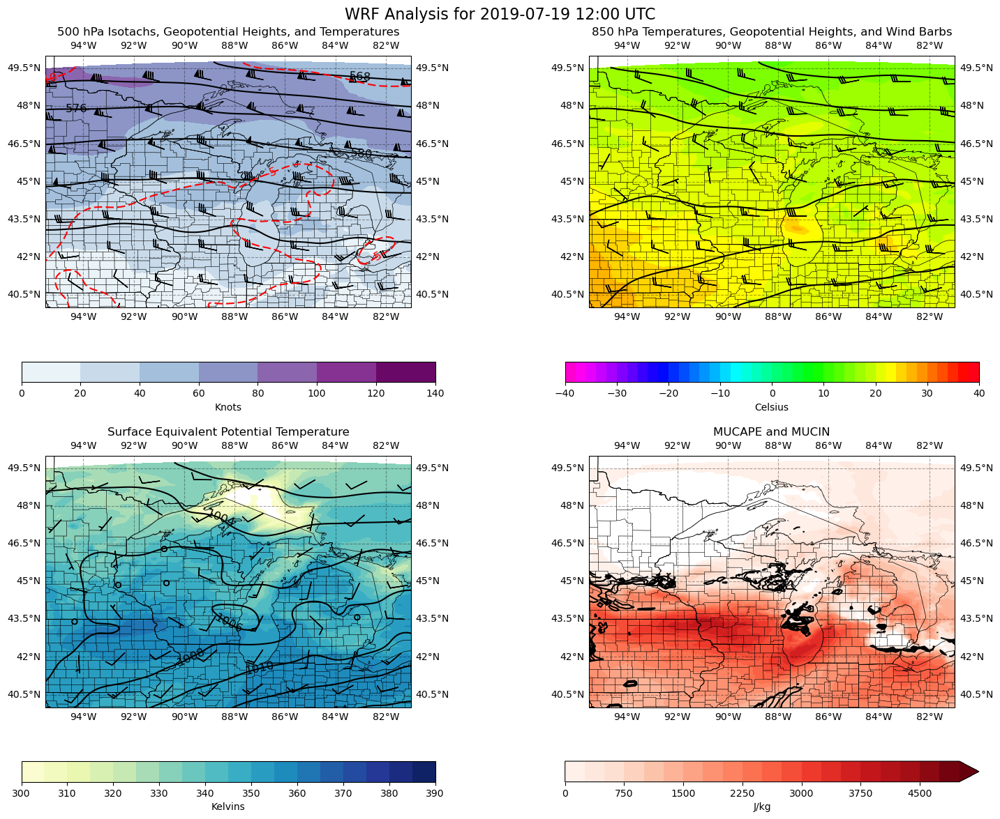

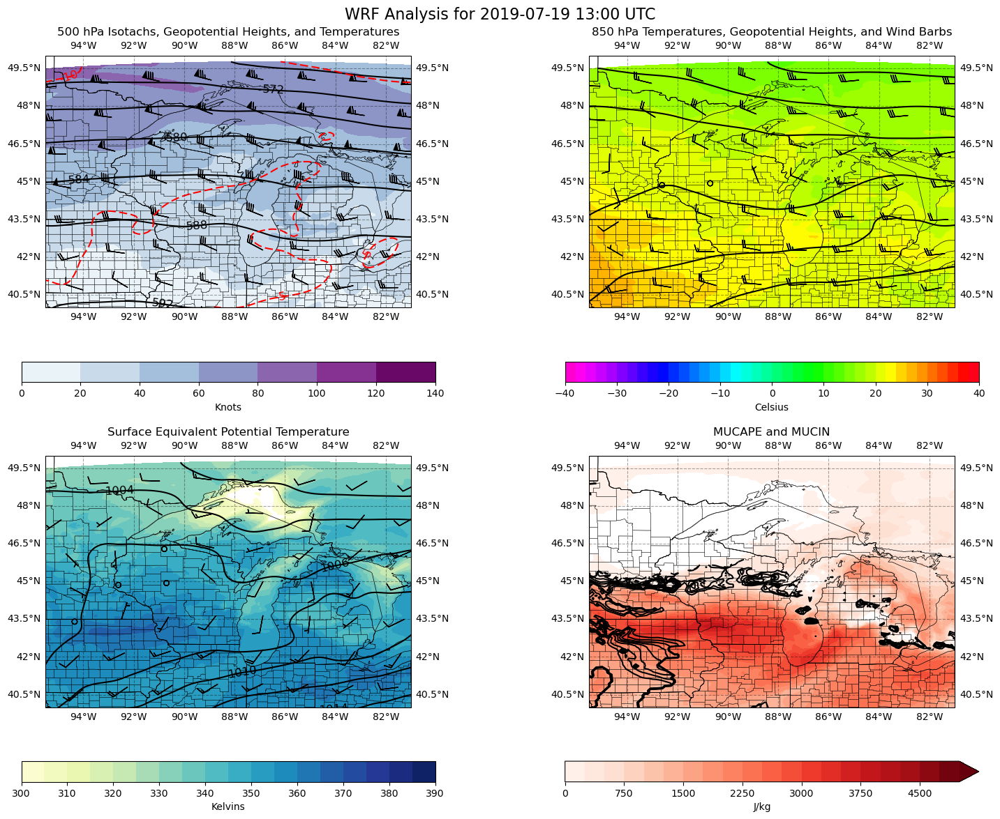

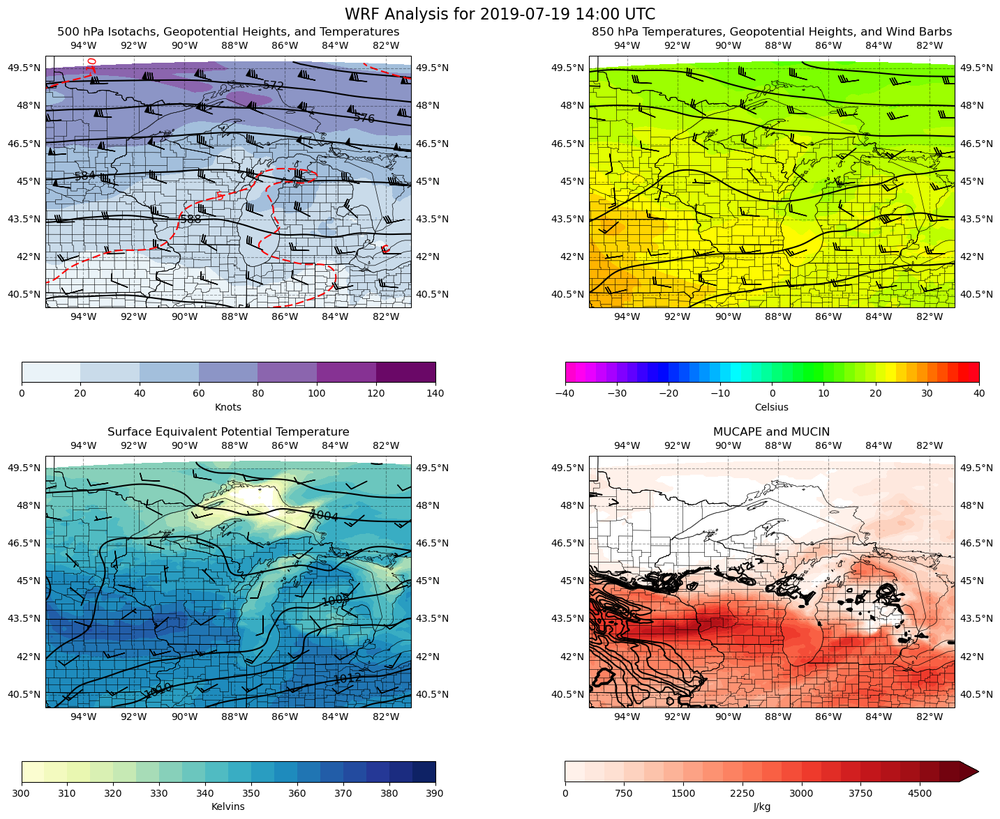

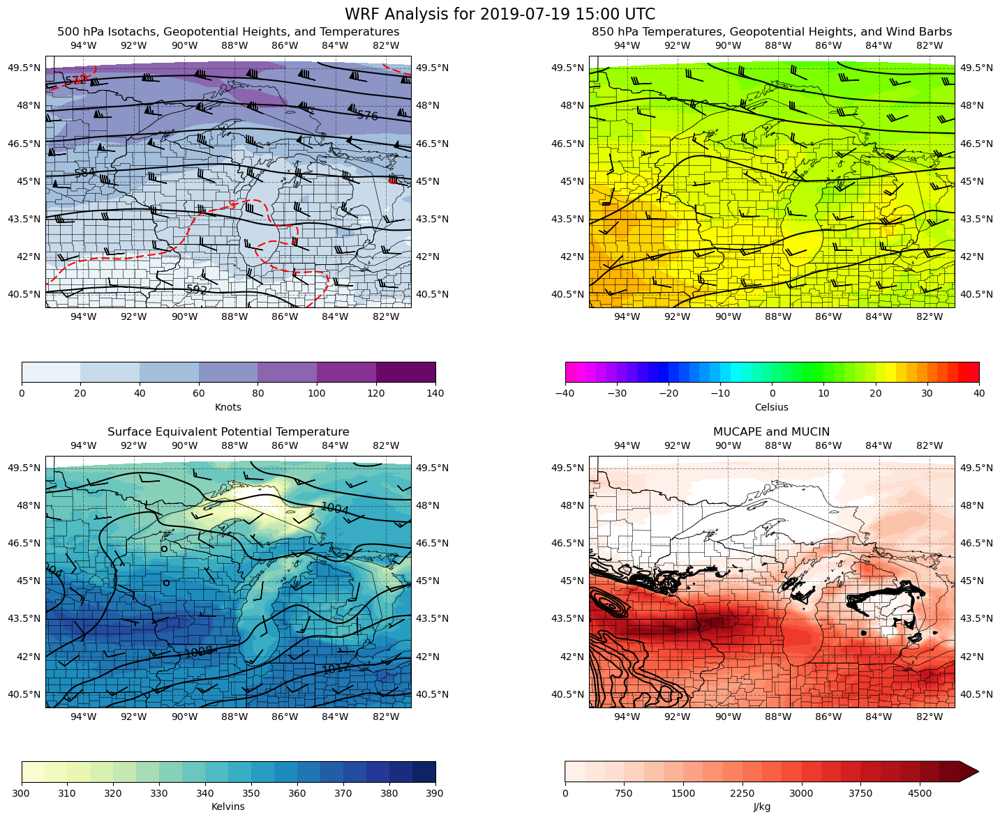

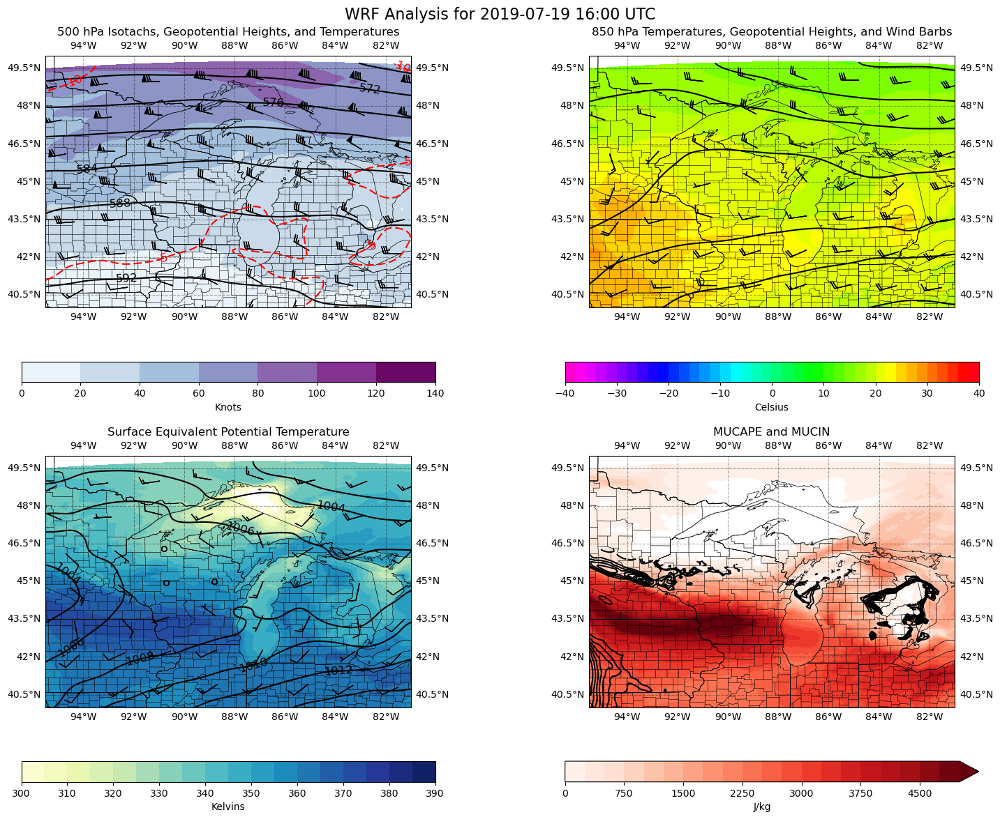

...

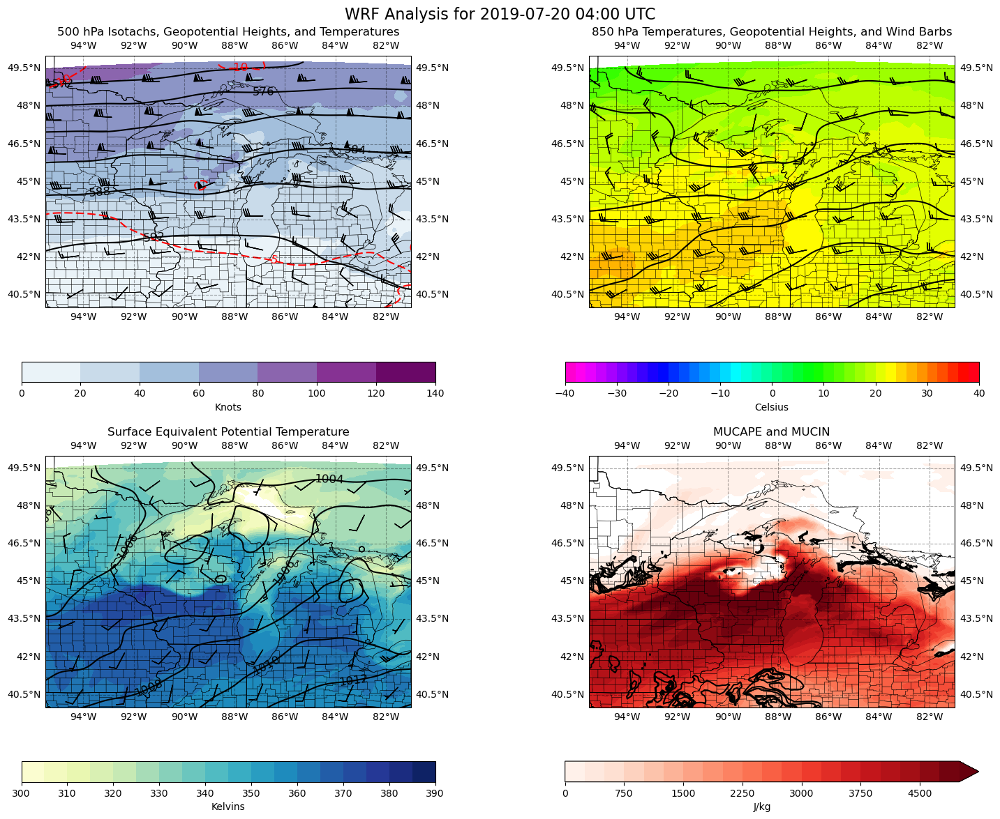

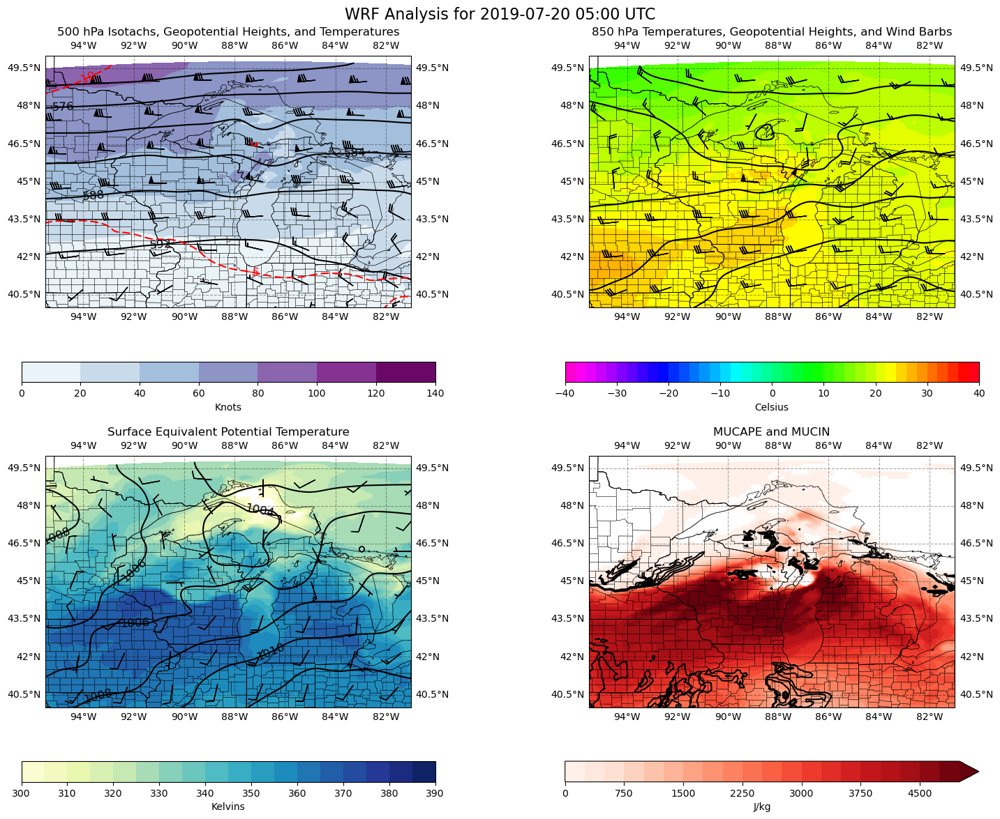

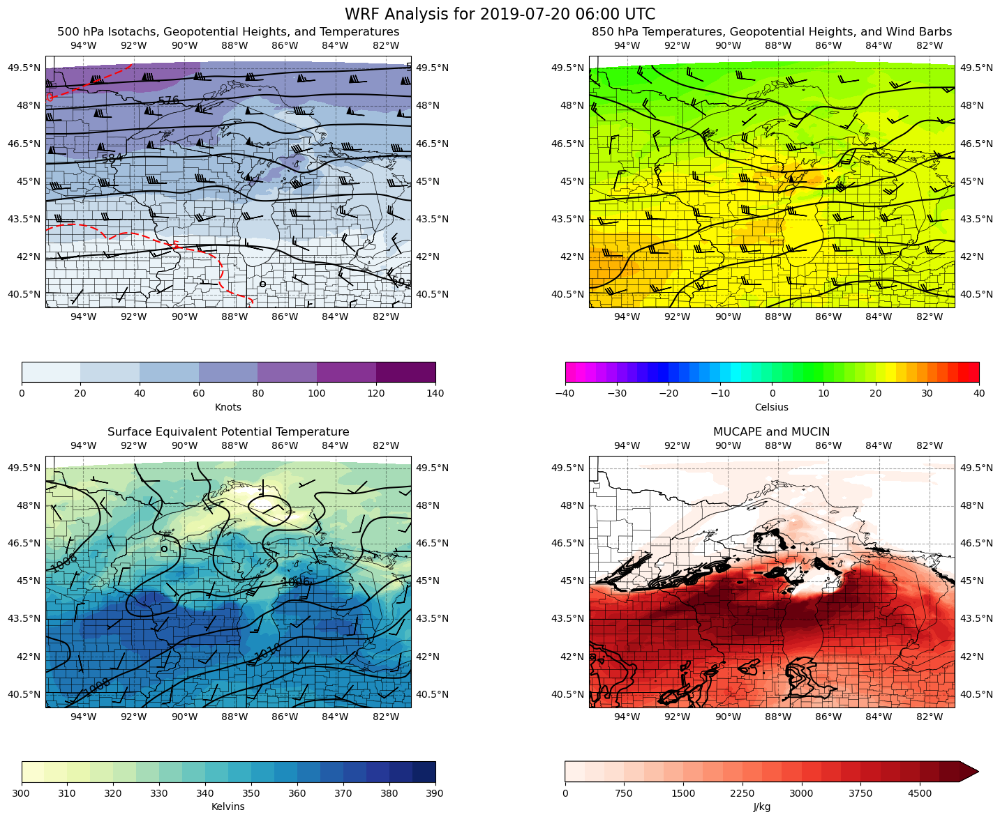

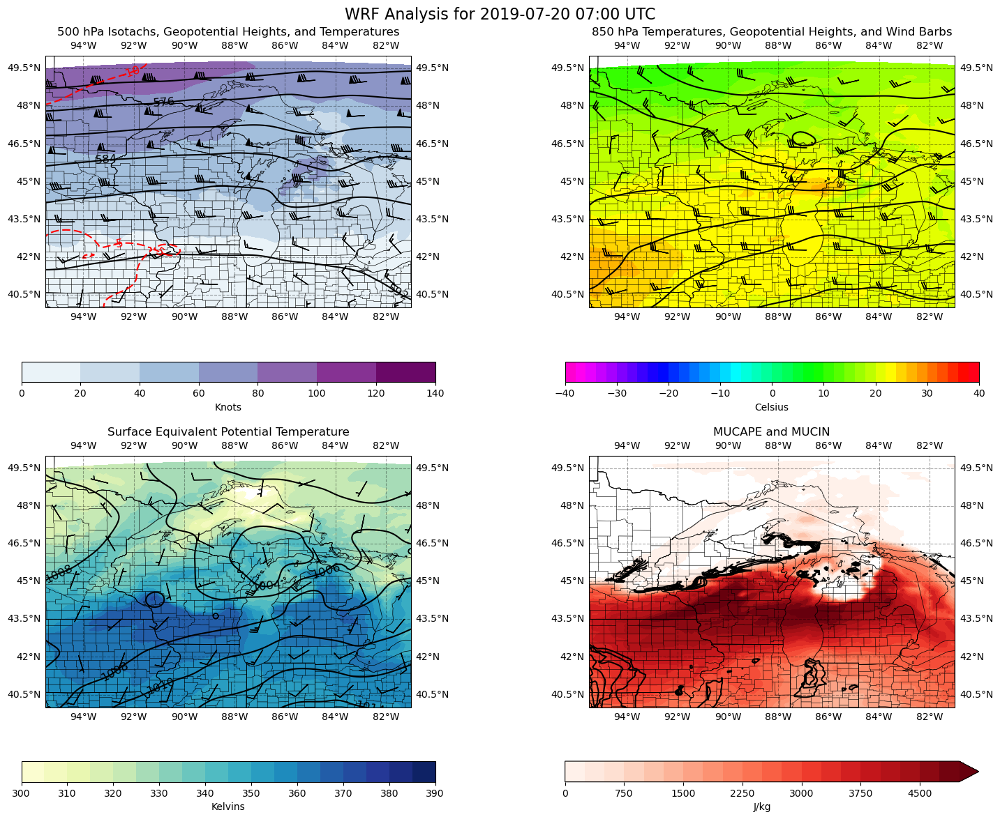

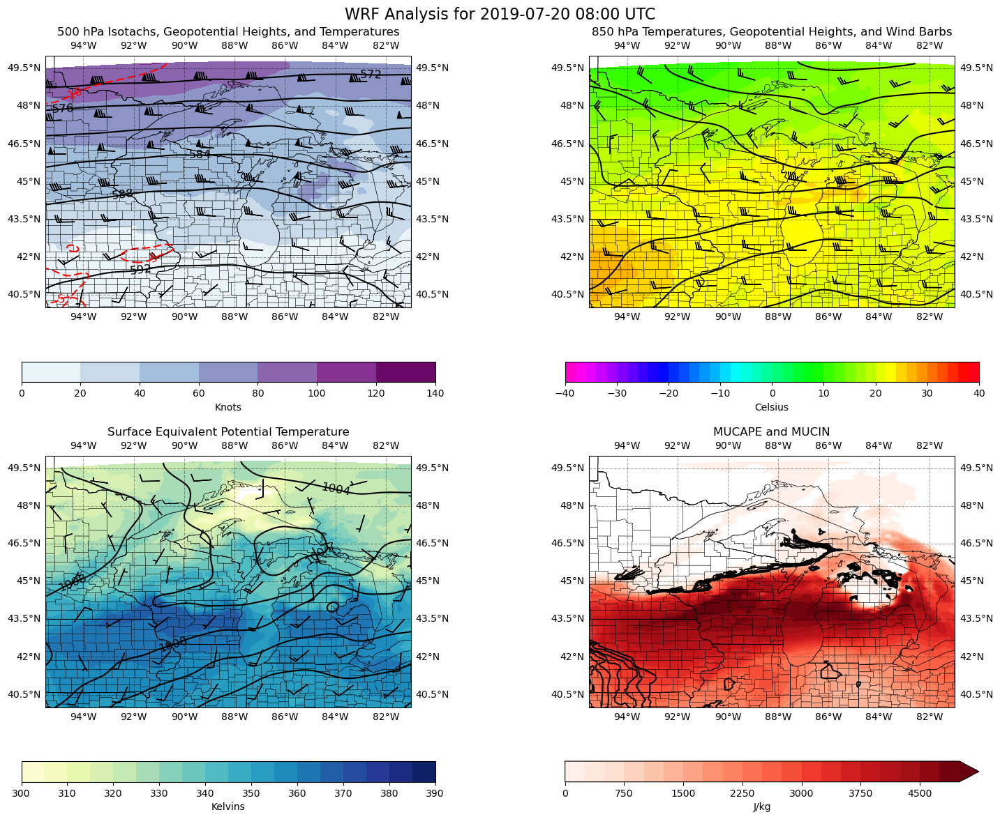

In [3]:
directory = 'c:\\Users\\Tony\\Desktop\\wrfoutput\\d1'
for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)
    wrf_4panel(file_path)